# Self-Driving Car Engineer Nanodegree


## Project: **Advanced Road Lane Finding** 
***
In this project, We will try to use more advanced techniques to identify lane lines on the road.  

Firstly we will need to calibrate the camera and extract the calibration information and then use this information to correct camera distorations for the input images.

Afterwards will do image transformation and change image prespective to get the birds eye view to detect laneLines and compute the lane curvature and the Bias from center.


The project is built on the environment of [CarND-Advanced-Lane-Lines](https://github.com/udacity/CarND-Advanced-Lane-Lines) that can be used as a starting point. Also it's needed to cover all of the [rubric points](https://review.udacity.com/#!/rubrics/1966/view) for this project.

---
Firstly let's start by the test images located in 'test_images/...'.  

---

## Camera Calibration Pipeline

**This is a part of the new pipeline**
The purpose of this part is to calibrate the camera based on the given camera images to generate the camera calibration parameters to make the warped image and perform the needed corrections

In [1]:
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob



# prepare object points
nx = 9 #The number of inside corners in x
ny = 6 #The number of inside corners in y

objpoints = [] #3D points mapping real world coordinates
imgpoints = [] #2D points mapping image plane coordinates


objp = np.zeros((nx*ny,3),np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2) #X,Y coordinates



#folder_in = 'camera_cal/'
folder_out = 'output_'

# Make a list of calibration images
files = glob.glob('camera_cal/calibration*.jpg')

for fname in files:
    #fname = 'calibration3.jpg'
    
    img = cv2.imread(fname)
    #plt.imshow(img)
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If found, draw corners
    if ret == True:
        # Draw and display the corners
        imgpoints.append(corners)
        objpoints.append(objp)
        
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        
        cv2.imwrite((folder_out+fname),img)


# Store data (serialize)
with open('imgpoints.pickle', 'wb') as handle:
    pickle.dump(imgpoints, handle, protocol=pickle.HIGHEST_PROTOCOL)
    

# Store data (serialize)
with open('objpoints.pickle', 'wb') as handle:
    pickle.dump(objpoints, handle, protocol=pickle.HIGHEST_PROTOCOL)

print('ImgPoints and Objpoints are saved successfully')

ImgPoints and Objpoints are saved successfully


## Helper Functions

Below are some helper functions to help get you started. They should look familiar from the lesson!

In [2]:
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob



def cal_undistort(img, objpoints, imgpoints):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)

    undist = cv2.undistort(img, mtx, dist, None, mtx)

    return undist


def warp_img(img, src, dst):
    # Pull out the x and y sizes and make a copy of the image
    img_size = (img.shape[1], img.shape[0])
    
    M = cv2.getPerspectiveTransform(src, dst)
    
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped

def pipeline(img, sobel_kernel=3 , s_thresh=(170, 255), sx_thresh=(20, 100), sy_thresh=(20, 100), orient='x'):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0, ksize = sobel_kernel) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    return color_binary



def abs_sobel_thresh(img, orient='x', sobel_kernel=3, s_orient_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if ( orient == 'x'):
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
        abs_sobel = np.absolute(sobelx)
    elif ( orient == 'y'):
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
        abs_sobel = np.absolute(sobely)
    
    
    # 3) Take the absolute value of the derivative or gradient
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
            
    s_binary = np.zeros_like(scaled_sobel)
    s_binary[(scaled_sobel > s_orient_thresh[0]) & (scaled_sobel < s_orient_thresh[1])] = 1

    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    return s_binary


def mag_threshold(img, sobel_kernel=3, m_thresh=(0, 255)):
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    abs_sobel = ((sobelx**2) + (sobely**2))**(1/2) 
    # Rescale to 8 bit
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= m_thresh[0]) & (scaled_sobel <= m_thresh[1])] = 1

    # Return the binary image
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor (img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    
    sobelx = cv2.Sobel( gray , cv2.CV_64F , 1 , 0, ksize=sobel_kernel)
    sobely = cv2.Sobel( gray , cv2.CV_64F , 0 , 1, ksize=sobel_kernel)
    
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    Sobel_Thresh = np.arctan2(abs_sobely, abs_sobelx)
    
    # 5) Create a binary mask where direction thresholds are met
    s_binary = np.zeros_like(Sobel_Thresh)
    s_binary[(Sobel_Thresh >= thresh[0]) & (Sobel_Thresh <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    
    return s_binary

def binary_thresh(image, sobel_kernel=3 , s_thresh=(90, 255), l_thresh=(90, 255), sx_thresh=(20, 100), sy_thresh=(100, 200), mag_thresh=(70, 200), dir_thresh=(0.5, 1.2) ,orient='x' ):
    
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Threshold color channel
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    # Apply each of the thresholding functions0
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=sobel_kernel, s_orient_thresh=sx_thresh)
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=sobel_kernel, s_orient_thresh=sy_thresh)
    mag_binary = mag_threshold(image, sobel_kernel=sobel_kernel, m_thresh=mag_thresh)
    dir_binary = np.uint8(dir_threshold(image, sobel_kernel=sobel_kernel, thresh=dir_thresh))
    
    color_binary = np.zeros_like(mag_binary)
    
    color_binary[((mag_binary == 1) | (s_binary == 1))] = 1
    
    return color_binary



def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin  # Update this
        win_xleft_high = leftx_current + margin  # Update this
        win_xright_low = rightx_current - margin  # Update this
        win_xright_high = rightx_current + margin  # Update this
        
        
        ### Identify the nonzero pixels in x and y within the window ###
        
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### If you found > minpix pixels, recenter next window ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))        
        
        ### (`right` or `leftx_current`) on their mean position ###
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]


    return leftx, lefty, rightx, righty

    
    
def fit_polynomial(binary_warped, xm_per_pix = 3.7/700, ym_per_pix = 30/720):
    # Find our lane pixels first
    leftx, lefty, rightx, righty = find_lane_pixels(binary_warped)
    
    ### Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty,leftx,2)
    right_fit = np.polyfit(righty,rightx,2)

    
    #return left_fit, right_fit, left_fit_real, right_fit_real
    return left_fit, right_fit
    
 
    ## Visualization ##
def visualization(binary_warped, left_fit, right_fit): 
    
    ## Visualization ##
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    y_eval = np.max(ploty)
    
    window_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    xsize = window_img.shape[1]
    ysize = window_img.shape[0]
    
    
    
    # Define a polygon region of interest 
    XX, YY = np.meshgrid(np.arange(0, xsize), np.arange(0, ysize))
    region_thresholds = (XX > (left_fit[0]*YY**2 + left_fit[1]*YY + left_fit[2])) & \
                        (XX < (right_fit[0]*YY**2 + right_fit[1]*YY + right_fit[2])) & \
                        (YY < (xsize + ysize)) & \
                        (YY > (XX*0 + 0))
    
    window_img[region_thresholds] = [0,255,0]
    
    return window_img, y_eval
    
    
    
    
    
def visualization2(binary_warped, left_fit, right_fit,  margin = 100):     
    
    ## Visualization ##
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    y_max = np.max(ploty)
    
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    
    
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    
    # Plot the polynomial lines onto the image
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return window_img, y_max
    
    
def calculate_curvature(left_fit, right_fit, y_eval, xm_per_pix = 3.7/700, ym_per_pix = 30/720):
    
    # Calculates the curvature of polynomial functions in pixels.
    
    
    ##### Implement the calculation of R_curve (radius of curvature) #####
    
    left_curverad = 0  ## Implement the calculation of the left line here
    left_curverad = ((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = 0  ## Implement the calculation of the right line here
    right_curverad = ((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    
    
    ploty = np.linspace(0, Fit.binary_warped.shape[0]-1, Fit.binary_warped.shape[0])
    
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    
    ### Calculate Bias from center
    
    middle = Fit.binary_warped.shape[1] / 2
    
    dist_left = (middle - left_fitx[Fit.binary_warped.shape[0]-1])
    
    dist_right = (right_fitx[Fit.binary_warped.shape[0]-1] - middle)
    diff=(dist_left - dist_right) * xm_per_pix
    
    

    return left_curverad , right_curverad ,  diff






def fit_poly(leftx, lefty, rightx, righty):
    ### Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
        
    return left_fit, right_fit

def search_around_poly(Fit, left_fit, right_fit, margin=100, xm_per_pix = 3.7/700):

    # Grab activated pixels
    nonzero = Fit.binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Calc both polynomials using ploty, left_fit and right_fit ###
    leftx_current = left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2]
    rightx_current = right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2]

    left_lane_inds = ((nonzerox > (leftx_current - margin)) & (nonzerox < (leftx_current + margin)))
    right_lane_inds = ((nonzerox > (rightx_current - margin)) & (nonzerox < (rightx_current + margin)))
    
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    
    # Fit new polynomials
    Fit.left_current = np.polyfit(lefty, leftx, 2)
    Fit.right_current = np.polyfit(righty, rightx, 2)
    
    return Fit.left_current, Fit.right_current



def check_sanity(Fit, tolerance = 70):
    
    Fit.detected = False
    #parallel check
    
    #Check at y = 0, middle, max
    
    ploty = np.linspace(0, Fit.binary_warped.shape[0]-1, Fit.binary_warped.shape[0])
    left_fitx = Fit.left_current[0]*ploty**2 + Fit.left_current[1]*ploty + Fit.left_current[2]
    right_fitx = Fit.right_current[0]*ploty**2 + Fit.right_current[1]*ploty + Fit.right_current[2]
    

    y_eval = np.int(np.max(ploty))
    
    # calculate the difference between left and right lane accross the 3 points
    compare = abs(right_fitx[y_eval] - left_fitx[y_eval])
    
        
    if(Fit.frame > 5):
        avg_left = np.mean(Fit.left_fit_value,axis=0)
        avg_right = np.mean(Fit.right_fit_value,axis=0)
        
        #check if lines are not equidistant from each others
        if (((abs(right_fitx[np.int((y_eval+1)/2)] - left_fitx[np.int((y_eval+1)/2)]) > (compare + tolerance))) | ((abs(right_fitx[np.int((y_eval+1)/2)] - left_fitx[np.int((y_eval+1)/2)]) < abs(compare - tolerance))) | (abs(right_fitx[0] - left_fitx[0]) > (compare + tolerance)) | (abs(right_fitx[0] - left_fitx[0]) < abs(compare - tolerance))) :
            #print("Not equidistant")
            #new detection is not accurate run main algorithm to find lane lines again:
            Fit.left_current, Fit.right_current = fit_polynomial(Fit.binary_warped, Fit.xm_per_pix, Fit.ym_per_pix)    
            #re-check values
            ploty = np.linspace(0, Fit.binary_warped.shape[0]-1, Fit.binary_warped.shape[0])
            left_fitx = Fit.left_current[0]*ploty**2 + Fit.left_current[1]*ploty + Fit.left_current[2]
            right_fitx = Fit.right_current[0]*ploty**2 + Fit.right_current[1]*ploty + Fit.right_current[2]
            y_eval = np.int(np.max(ploty))
            #calculate the difference between left and right lane accross the 3 points
            compare = abs(right_fitx[y_eval] - left_fitx[y_eval])


            if (((abs(right_fitx[np.int((y_eval+1)/2)] - left_fitx[np.int((y_eval+1)/2)]) > (compare + tolerance))) | ((abs(right_fitx[np.int((y_eval+1)/2)] - left_fitx[np.int((y_eval+1)/2)]) < abs(compare - tolerance))) | (abs(right_fitx[0] - left_fitx[0]) > (compare + tolerance)) | (abs(right_fitx[0] - left_fitx[0]) < abs(compare - tolerance))) :
                
                #print("Not equidistant2")
                Fit.left_fit_value[1:5] = Fit.left_fit_value [0:4]
                Fit.left_fit_value[0] = Fit.left_current
                Fit.right_fit_value[1:5] = Fit.right_fit_value [0:4]
                Fit.right_fit_value[0] = Fit.right_current
                Fit.detected = True
                

            else:
                #use average of past detected value
                Fit.left_current = avg_left
                Fit.right_current = avg_right



        #if not save the current value to the array
        else:

            Fit.left_fit_value[1:5] = Fit.left_fit_value [0:4]
            Fit.left_fit_value[0] = Fit.left_current

            Fit.right_fit_value[1:5] = Fit.right_fit_value [0:4]
            Fit.right_fit_value[0] = Fit.right_current
            Fit.detected = True

        
    else:
        Fit.left_fit_value[1:5] = Fit.left_fit_value [0:4]
        Fit.left_fit_value[0] = Fit.left_current
        Fit.right_fit_value[1:5] = Fit.right_fit_value [0:4]
        Fit.right_fit_value[0] = Fit.right_current
        Fit.detected = True

        
    
    
    return Fit.left_current, Fit.right_current




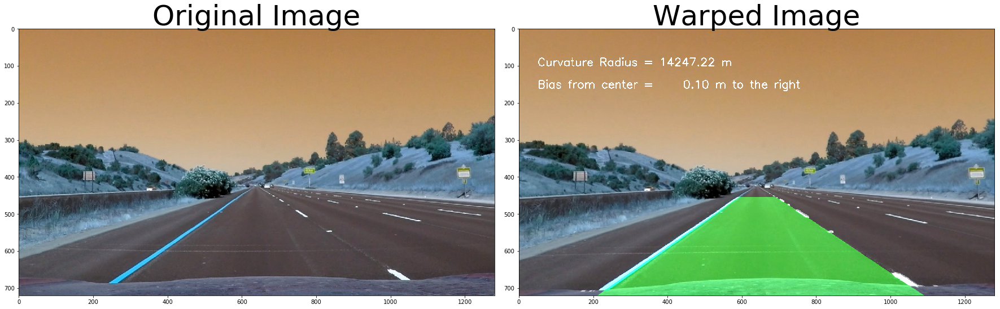

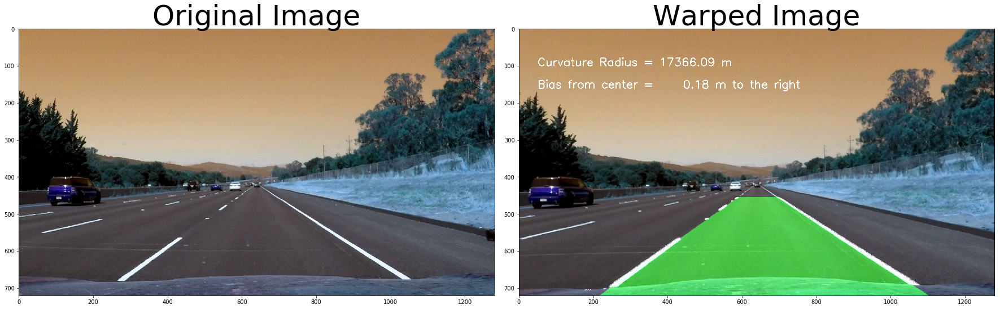

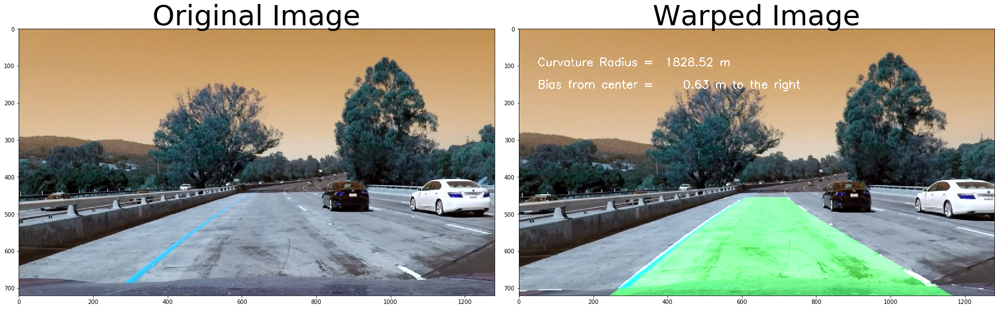

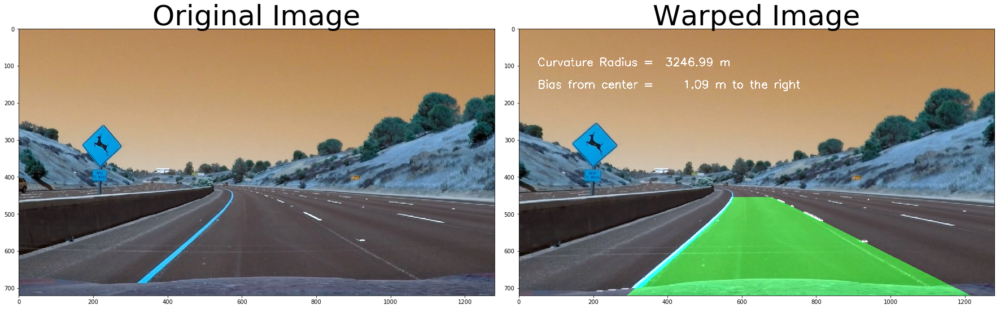

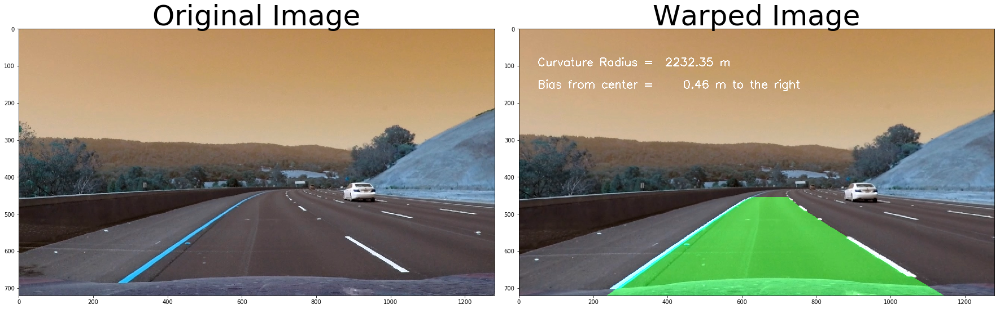

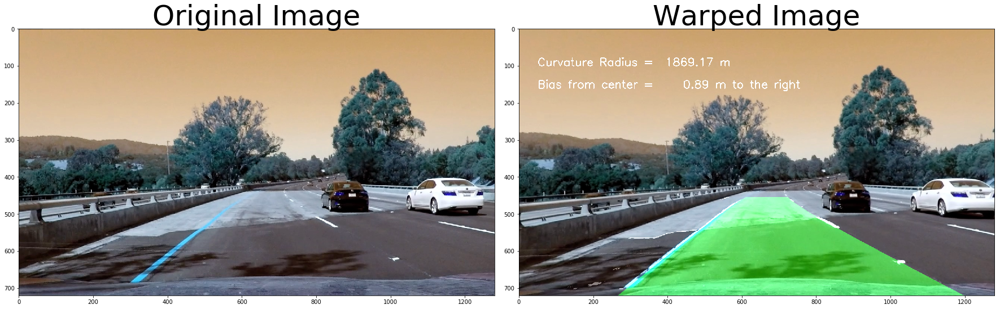

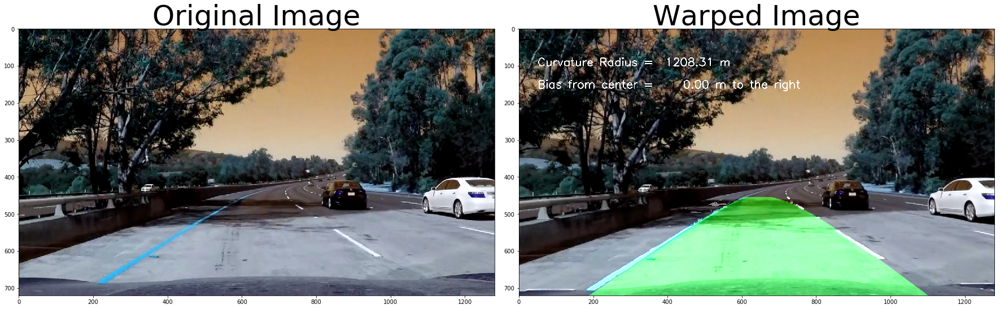

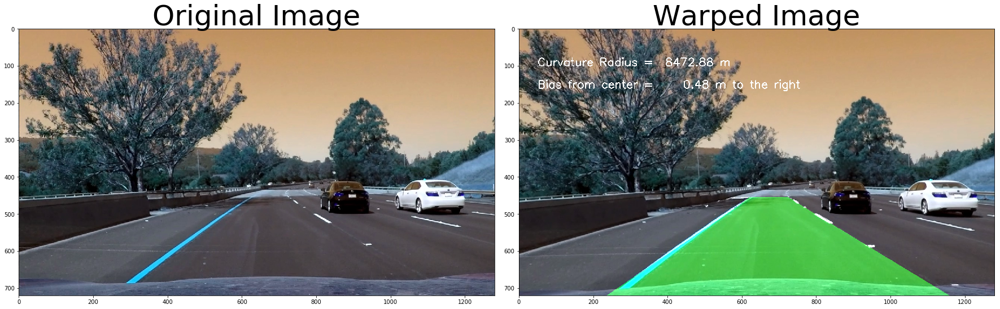

In [17]:
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob


class Fit(object):
    # Class variable, shared by all instances of this class
    left_fit_value  = [[] for i in range(5)]
    right_fit_value = [[] for i in range(5)]
    img = [np.array([False])]
    binary_warped = [np.array([False])]
    # was the line detected in the last iteration?
    detected = False  
    #polynomial coefficients for the most recent fit
    #current_fit = [np.array([False])]
    left_current = [np.array([False])]
    right_current = [np.array([False])]
    #radius of curvature of the line in some units
    radius_of_curvature = None 
    #ym_per_pix = 15/170
    #xm_per_pix = 3.7/850
    ym_per_pix = 30/720
    xm_per_pix = 3.7/700
        
def setvalue(Fitvalue, value_left, value_right):
    Fitvalue.left_current = value_left #(np.add(Fitvalue.left_fit, value_left)).tolist() 
    Fitvalue.right_current = value_right #(np.add(Fitvalue.right_fit, value_right)).tolist() 
    #Fitvalue.right_fit = value_right + value_right
    #return Fitvalue.left_fit_value, Fitvalue.right_fit_value

# Warp and prespectie transform
src = np.float32([[481,520],[799,520],[213,690],[1065,690]])
dst = np.float32([[214,520],[1065,520],[214,690],[1065,690]])
#src = np.float32([[491,520],[809,520],[223,690],[1077,690]])
#dst = np.float32([[224,520],[1077,520],[224,690],[1077,690]])
       



folder_out = 'output_images/'

# Load data (deserialize)
with open('imgpoints.pickle', 'rb') as handle:
    imgpoints = pickle.load(handle)

# Load data (deserialize)
with open('objpoints.pickle', 'rb') as handle:
    objpoints = pickle.load(handle)
    
# Make a list of calibration images
files = glob.glob('test_images/*.jpg')
#print(files)
for fname in files:
    
    Fit.img = cv2.imread(fname)
    
    # Read in an image
    gray = cv2.cvtColor(Fit.img,cv2.COLOR_BGR2GRAY)
    
    
    # generate the undistorted image
    undistorted = cal_undistort(Fit.img, objpoints, imgpoints)

    # Applying image thresholds to detect and extract lane lines information
    result = binary_thresh(undistorted, sobel_kernel=7,s_thresh=(140, 255), sx_thresh=(20, 100), sy_thresh=(20, 100), orient='x')
    
    # Apply wrapping technique to get birds-eye view
    Fit.binary_warped = warp_img(result, src, dst)
    
    # Fitting 2nd order polynomial to detect lane lines and curvature
    Fit.left_current, Fit.right_current = fit_polynomial(Fit.binary_warped, Fit.xm_per_pix, Fit.ym_per_pix)    
    
    # Alternative method that can be applied after successfully detecting lanes in previous frame in a video file
    #left_fit, right_fit = search_around_poly(Fit, Fit.left_current, Fit.right_current, 50)
    
    # Visualization of lane lines on the image
    out_img , y_max = visualization(Fit.binary_warped, Fit.left_current, Fit.right_current)
    #out_img = visualization2(binary_warped, left_fit, right_fit, ploty, 50)
    
    # Calculating Bias and Curvature
    left_curverad , right_curverad, diff = calculate_curvature(Fit.left_current, Fit.right_current, y_max)
    Avg_curvature = ((left_curverad + right_curverad) / 2)
    #setvalue(Fit, left_fit, right_fit )
    
    #reassemble on one image
    unwarped_out_img = warp_img(out_img, dst, src)
    out_img = cv2.addWeighted(undistorted, 1, unwarped_out_img, 0.5, 0)
    
    
    # Writting the output data over the image frame
    cv2.putText(out_img,
                    "Curvature Radius = %8.2f m" % Avg_curvature,
                    (50, 100),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    1,
                    color=(255, 255, 255),
                    thickness=2)
    
    if (diff>0):
        cv2.putText(out_img,
                    "Bias from center = %8.2f m to the left" % abs(diff),
                    (50, 160),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    1,
                    color=(255, 255, 255),
                    thickness=2)
    elif (diff<0):
        cv2.putText(out_img,
                    "Bias from center = %8.2f m to the right" % abs(diff),
                    (50, 160),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    1,
                    color=(255, 255, 255),
                    thickness=2)
    else:
        cv2.putText(out_img,
                    "Camera is at the center" ,
                    (50, 150),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    1,
                    color=(255, 255, 255),
                    thickness=2)
    
    filename = fname.split('\\')
    
    
    # Writting image to the folder
    cv2.imwrite((folder_out+filename[1]),out_img)
    
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(Fit.img)
    
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(out_img)
    ax2.set_title('Warped Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)



## Build a Lane Finding Pipeline to apply on video



Build the pipeline and run your solution on the provided video sample.

In [4]:
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob




# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

# A class to receive the characteristics of each line detection
class Fit(object):
    # Class variable, shared by all instances of this class
    left_fit_value  = [[] for i in range(5)]
    right_fit_value = [[] for i in range(5)]
    img = [np.array([False])]
    binary_warped = [np.array([False])]
    # was the line detected in the last iteration?
    detected = False  
    #current_fit = [np.array([False])]
    left_current = [np.array([False])]
    right_current = [np.array([False])]
    frame = 0
    #ym_per_pix = 15/170
    #xm_per_pix = 3.7/850
    ym_per_pix = 30/720
    xm_per_pix = 3.7/700
  
    


# Load data (deserialize)
with open('imgpoints.pickle', 'rb') as handle:
    imgpoints = pickle.load(handle)

# Load data (deserialize)
with open('objpoints.pickle', 'rb') as handle:
    objpoints = pickle.load(handle)
    

def process_image(image):
    # The output you return should be a color image (3 channel) for processing video below
    # you should return the final output (image where lines are drawn on lanes)
    # Building pipeline that will draw lane lines on the frame by frame bases
    # then save them to the output directory.
    
    #ym_per_pix = 15/170
    #xm_per_pix = 3.7/850
    #ym_per_pix = 30/720
    #xm_per_pix = 3.7/700 
    
    Fit.frame +=1

    
    undistorted = cal_undistort(image, objpoints, imgpoints)

    # Warp and prespectie transform
    #src = np.float32([[481,520],[799,520],[213,690],[1067,690]])
    #dst = np.float32([[214,520],[1067,520],[214,690],[1067,690]])
        
    src = np.float32([[491,520],[809,520],[223,690],[1077,690]])
    dst = np.float32([[224,520],[1077,520],[224,690],[1077,690]])
    
    result_binary = binary_thresh(undistorted, sobel_kernel=5,s_thresh=(140, 255), sx_thresh=(20, 100), sy_thresh=(20, 100), orient='x')
    
    Fit.binary_warped = warp_img(result_binary, src, dst)
    
    if Fit.detected == False:
        #run for the 1st detected frame and if the previous frame is not correctly detected, afterwards switch to else statment
        
        Fit.left_current, Fit.right_current = fit_polynomial(Fit.binary_warped)    
        
        # Checking for Sanity of the output polynomial functions
        Fit.left_current, Fit.right_current = check_sanity(Fit , 50)
        
        warped_mask , y_max = visualization(Fit.binary_warped, Fit.left_current, Fit.right_current)
        
        
        
    else:
                
        Fit.left_current, Fit.right_current = search_around_poly(Fit, Fit.left_current, Fit.right_current, 50)
        # Checking for Sanity of the output polynomial functions
        Fit.left_current, Fit.right_current = check_sanity(Fit , 50)
        
        warped_mask , y_max = visualization(Fit.binary_warped, Fit.left_current, Fit.right_current)
        
    

        
    #re-assemble the result on origianl frame
    mask = warp_img(warped_mask, dst, src)
    out_img = cv2.addWeighted(undistorted, 1, mask, 0.5, 0) 
    
    
    # Calculate Radius of Curvature and Bias from center
    left_curverad , right_curverad, diff = calculate_curvature(Fit.left_current, Fit.right_current, y_max)
    Avg_curvature = ((left_curverad + right_curverad) / 2)
                
    
    cv2.putText(out_img,
                    "Curvature Radius = %8.2f m" % Avg_curvature,
                    (50, 100),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    1,
                    color=(255, 255, 255),
                    thickness=2)
    
    if (diff>0):
        cv2.putText(out_img,
                    "Bias from center = %8.2f m to the left" % abs(diff),
                    (50, 160),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    1,
                    color=(255, 255, 255),
                    thickness=2)
    elif (diff<0):
        cv2.putText(out_img,
                    "Bias from center = %8.2f m to the right" % abs(diff),
                    (50, 160),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    1,
                    color=(255, 255, 255),
                    thickness=2)
    else:
        cv2.putText(out_img,
                    "Camera is at the center" ,
                    (50, 150),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    1,
                    color=(255, 255, 255),
                    thickness=2)

    
    
    
    
    return out_img

In [5]:
sample_output = 'test_videos_output/project_video.mp4'
## To try your pipeline on a shorter subclip of the video use the remarked statment below the main one.
#clip1 = VideoFileClip("project_video.mp4")
clip1 = VideoFileClip("project_video.mp4")

sample_clip = clip1.fl_image(process_image) 
%time sample_clip.write_videofile(sample_output, audio=False)

Moviepy - Building video test_videos_output/project_video.mp4.
Moviepy - Writing video test_videos_output/project_video.mp4



Moviepy - Done !
Moviepy - video ready test_videos_output/project_video.mp4
Wall time: 40min 39s


Play the video inline, or access the video in your filesystem (located inside test_videos_output directory) and play it in a video player.

In [6]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(sample_output))

---



We Can also try over the challenge videos included in the repo and do further enhancements to improve the robustness acrros various conditions.

---